# HCP dataset, working memory (WM) subdataset
this notebook contains code for group project (group Hydrated Mammals, pod Watery Camels) in [Neuromatch Academy](https://portal.neuromatchacademy.org/), during summer 2021, [computational neuroscience programme](https://compneuro.neuromatch.io/)

This notebook made for google colab: 

<a href="https://colab.research.google.com/github/... .ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open this notebook in Colab"/></a>

## Load HCP 2021, prepare constants
**NB:**
* In order to use this dataset, please electronically sign the HCP data use terms at [ConnectomeDB](https://db.humanconnectome.org).Instructions for this are on pp. 24-25 of the [HCP Reference Manual](https://www.humanconnectome.org/storage/app/media/documentation/s1200/HCP_S1200_Release_Reference_Manual.pdf).

* For a detailed description of the tasks have a look pages 45-54 of the [HCP reference manual](https://www.humanconnectome.org/storage/app/media/documentation/s1200/HCP_S1200_Release_Reference_Manual.pdf).

* Downloading this dataset will create the `regions.npy` file, which contains the region name and network assignment for each parcel. Detailed information about the name used for each region is provided [in the Supplement](https://static-content.springer.com/esm/art%3A10.1038%2Fnature18933/MediaObjects/41586_2016_BFnature18933_MOESM330_ESM.pdf) to [Glasser et al. 2016](https://www.nature.com/articles/nature18933).
Information about the network parcellation is provided in [Ji et al, 2019](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6289683/).

In [1]:
# import os
from pathlib import Path
from collections import namedtuple # for labels
import itertools

import numpy as np
import pandas as pd
from sklearn import linear_model as LM

import matplotlib.pyplot as plt
from scipy import stats, fft
from matplotlib import colors, cm as colormaps
import seaborn as sns

!pip install nilearn --quiet
from nilearn import plotting as ni_plot, datasets as ni_ds

     |████████████████████████████████| 4.9 MB 28.9 MB/s 


/usr/local/lib/python3.7/dist-packages/nilearn/datasets/__init__.py:89: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [2]:
# @title use the google's VM storage for dataset
# @markdown * changes are not saved

# @markdown * fast on saving and retrieving data

# @markdown * HCP_DIR is set to `/content/hcp`

def download_hcp(dst_dir: Path):
  """downloads HCP, brain atlas (for 3d plots)"""
  arc_p = dst_dir.parent / "hcp_task.tgz"
  atlas_p = dst_dir / "atlas.npz"
  if (arc_p).exists():
    print(f"archive {arc_p} already exists, we assume dataset loaded")
  else:
    print("loading HCP, this will take about 2 mins")
    dst_dir.mkdir(parents=True, exist_ok=False)
    arc_p = str(arc_p)
    dst_dir = str(dst_dir)
    atlas_p = str(atlas_p)
    
    !wget -qO $arc_p https://osf.io/s4h8j/download/
    !tar -xzf $arc_p -C $dst_dir --strip-components=1
    !wget -qO $atlas_p https://osf.io/j5kuc/download

HCP_DIR = Path("/content/hcp")
download_hcp(HCP_DIR)

loading HCP, this will take about 2 mins


In [3]:
# @title you can use google drive for saving results
# @markdown * saves changes

# @markdown * verrry slow compared to VM (like 10x slower)

# @markdown * RESULTS_DIR is created (if not present) and set to `/content/drive/MyDrive/nma_results`

from google.colab import drive
drive.mount("/content/drive/")

RESULTS_DIR = Path("/content/drive/MyDrive/nma_results")
if not RESULTS_DIR.exists():
  RESULTS_DIR.mkdir(parents=False)
  print(f"{RESULTS_DIR} was not found, so i've created one")

Mounted at /content/drive/
/content/drive/MyDrive/nma_results was not found, so i've created one


In [4]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/master/nma.mplstyle")

In [5]:
# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 339

# The data have already been aggregated into ROIs from the Glasser parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in seconds

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated twice in each subject
N_RUNS = 2

# There are 7 tasks. Each has a number of 'conditions'

EXPERIMENTS = {
    'MOTOR'      : {'runs': [5,6],   'cond':['lf','rf','lh','rh','t','cue']},
    'WM'         : {'runs': [7,8],   'cond':['0bk_body','0bk_faces','0bk_places','0bk_tools','2bk_body','2bk_faces','2bk_places','2bk_tools']},
    'EMOTION'    : {'runs': [9,10],  'cond':['fear','neut']},
    'GAMBLING'   : {'runs': [11,12], 'cond':['loss','win']},
    'LANGUAGE'   : {'runs': [13,14], 'cond':['math','story']},
    'RELATIONAL' : {'runs': [15,16], 'cond':['match','relation']},
    'SOCIAL'     : {'runs': [17,18], 'cond':['mental','rnd']}
}

# You may want to limit the subjects used during code development.
# This will use all subjects:
subjects = range(N_SUBJECTS)

In [6]:
# @markdown NMA provides parcellation annotations. Here we load them as `REGIONS` (pd.DataFrame)
def get_regions():
  x = np.load(HCP_DIR/"regions.npy")
  d = pd.DataFrame(x[..., 0:2], columns=("name", "network"))
  d["hemis"] = ["Right", ] * int(N_PARCELS/2) + ["Left", ] * int(N_PARCELS/2)
  return d

REGIONS = get_regions()
REGIONS

,name,network,hemis
0,R_V1,Visual1,Right
1,R_MST,Visual2,Right
2,R_V6,Visual2,Right
3,R_V2,Visual2,Right
4,R_V3,Visual2,Right
...,...,...,...
355,L_STSva,Posterior-Mu,Left
356,L_TE1m,Frontopariet,Left
357,L_PI,Cingulo-Oper,Left
358,L_a32pr,Cingulo-Oper,Left


## Help functions

In [8]:
# we use `Label` class to uniformely access dataset files 
Label = namedtuple("Label", ("experiment", "run", "subject", "condition"))
Label.__doc__ = """
namedtuple (see `help(namedtuple)`) for accessing dataset fields:
experiment: str, see `list(EXPERIMENTS.keys())`
run: int in {0, 1}
subject: int in range 0:N_SUBJECTS
condition: str or None. None means that no EVs will be loaded
"""

def load_ts(l: Label, remove_mean: bool = True) -> "np.ndarray[float] of shape (N_PARCELS, timepoints)":
  """loads BOLD timeseries for single subject"""
  run_  = EXPERIMENTS[l.experiment]['runs'][l.run]
  path = HCP_DIR / f"subjects/{l.subject}/timeseries/bold{run_}_Atlas_MSMAll_Glasser360Cortical.npy"
  bold = np.load(path)
  return bold - bold.mean(axis=1, keepdims=True) if remove_mean else bold

def load_ev(l: Label) -> slice:
  """loads explanatory variable (event onset, duration) as a slice"""
  if l.condition is None:
    return slice(None, None) #masks whole array
  else:
    path = HCP_DIR / f"subjects/{l.subject}/EVs/tfMRI_{l.experiment}_{'RL' if l.run is 0 else 'LR'}/{l.condition}.txt"
    ev = np.loadtxt(path, ndmin=2, unpack=True) # shape (3, N) first dimension is onset, duration, amplitude
    onsets = np.floor(ev[0] / TR).astype(int) 
    durations = np.ceil(ev[1]/ TR).astype(int)
    # amplitude = ev[3]
    return [slice(o, o+d) for o, d in zip(onsets, durations)] # slices are more compact than mask arrays, and have the same syntax: `array[mask]`

def slice_to_range(x: slice) -> range:
  """if x.stop is None uses 2**62, as a largest integer that can be obtained by left shifting 2"""
  return range(
       0 if x.start is None else x.start, 
       2 << 62 if x.stop is None else x.stop,
       1 if x.step is None else x.step
   )

def common_label_generator(conditions: "list[str]", runs=(0, ), experiments=("WM", ), subjects: slice = slice(None, N_SUBJECTS)) -> "generator[Label]":
  for e, r, s, c in itertools.product(experiments, runs, slice_to_range(subjects), conditions):
    yield Label(e, r, s, c)


def take(n, gen):
  for _ in range(n):
    yield next(gen)

## visualizations of the dataset

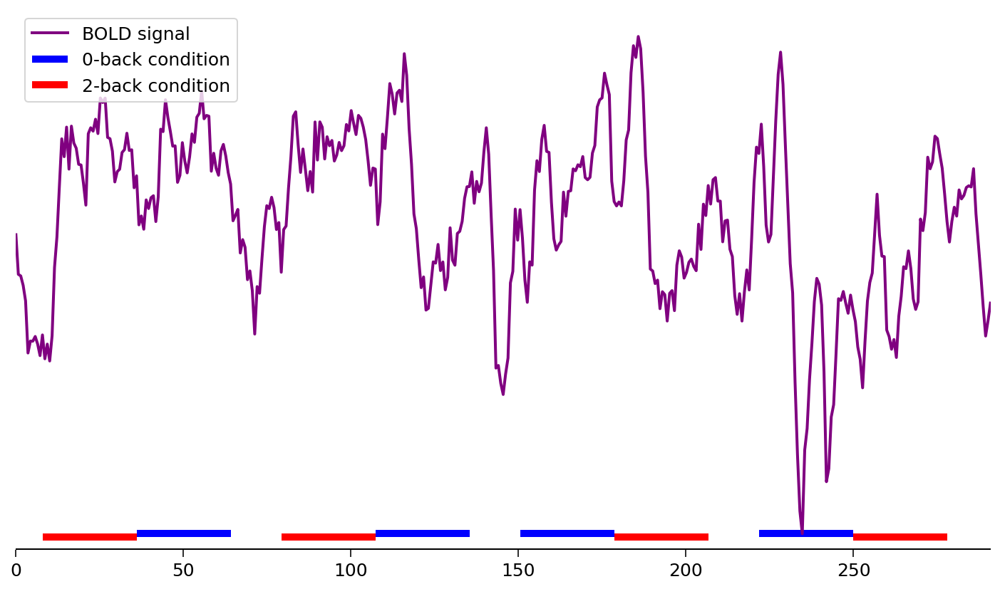

In [9]:
# @markdown for dataset visulization #1
def remove_y_axis(ax1):
  from matplotlib.lines import Line2D
  ax1.set_frame_on(False)
  ax1.get_xaxis().tick_bottom()
  ax1.axes.get_yaxis().set_visible(False)
  xmin, xmax = ax1.get_xaxis().get_view_interval()
  ymin, ymax = ax1.get_yaxis().get_view_interval()
  ax1.add_artist(Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))
  return ax1

def plot_bold_example():
  lbl = next(common_label_generator((None,)))
  ts = load_ts(lbl)
  intervals_0bk = []
  intervals_2bk = []
  for lbl in take(4, common_label_generator(("0bk_faces", "0bk_places", "0bk_tools", "0bk_body"))):
    ev = load_ev(lbl)[0]
    intervals_0bk.append((ev.start, ev.stop))
  intervals_0bk = np.array(intervals_0bk)
  for lbl in take(4, common_label_generator(("2bk_faces", "2bk_places", "2bk_tools", "2bk_body"))):
    ev = load_ev(lbl)[0]
    intervals_2bk.append((ev.start, ev.stop))
  intervals_2bk = np.array(intervals_2bk)

  #now we plot that
  roi = 0
  fig, ax = plt.subplots(1,1, figsize=(10, 6))
  x_points = np.arange(0, len(ts[roi])*TR, TR)
  ax.plot(x_points, ts[roi], c="purple", label="BOLD signal", lw=2)
  ymin = ts[roi].min()
  ymax = ts[roi].max()
  ymin_ = np.array([ymin]*4)
  ax.hlines(ymin_, intervals_0bk[:, 0]*TR, intervals_0bk[:, 1]*TR, colors="b", label="0-back condition", lw=5)
  ax.hlines(ymin_*1.01, intervals_2bk[:, 0]*TR, intervals_2bk[:, 1]*TR, colors="r", label="2-back condition", lw=5)
  ax.set_xlim(x_points[0], x_points[-1])
  ax.set_ylim(ymin*1.05, ymax*1.15)
  ax = remove_y_axis(ax)
  ax.legend(loc="upper left")
  return fig

fig = plot_bold_example()

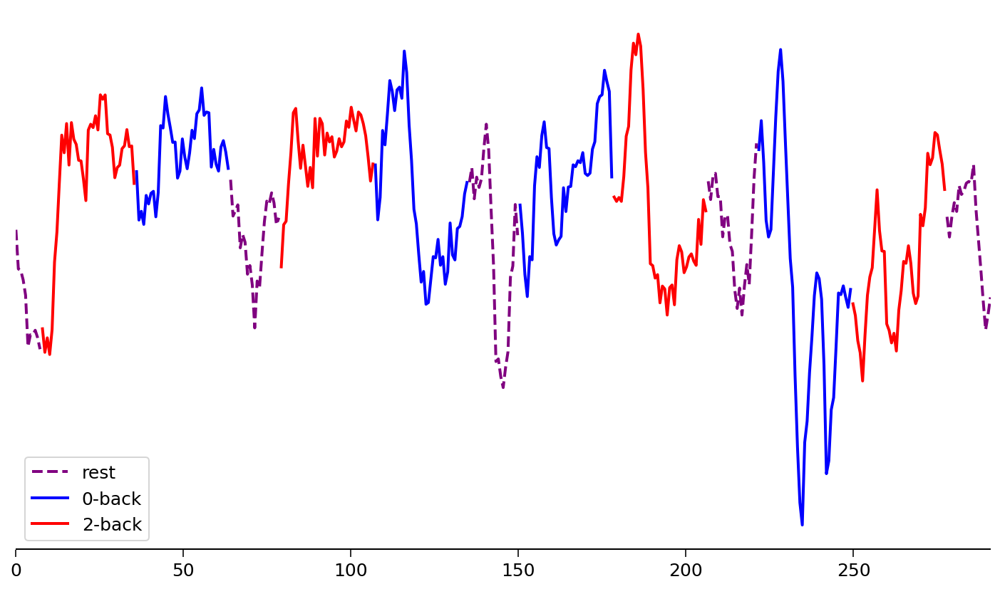

In [10]:
# @markdown for dataset visualization #2

def slices_to_mask(xs: "[slice]", l: "length") -> "bool array":
  y = np.zeros(l, dtype=bool)
  for x in xs:
    y[x] = True
  return y

def plot_bold_example2():
  roi = 0
  lbl = next(common_label_generator((None,)))
  ts = load_ts(lbl)[roi]
  evs_0bk = []
  evs_2bk = []
  for lbl in take(4, common_label_generator(("0bk_faces", "0bk_places", "0bk_tools", "0bk_body"))):
    ev = load_ev(lbl)[0]
    evs_0bk.append(ev)
  mask_0bk = slices_to_mask(evs_0bk, len(ts))

  for lbl in take(4, common_label_generator(("2bk_faces", "2bk_places", "2bk_tools", "2bk_body"))):
    ev = load_ev(lbl)[0]
    evs_2bk.append(ev)
  mask_2bk = slices_to_mask(evs_2bk, len(ts))

  rest = np.where(mask_0bk | mask_2bk, np.nan, ts)
  bk2 = np.where(mask_2bk, ts, np.nan)
  bk0 = np.where(mask_0bk, ts, np.nan)

  #now we plot that
  fig, ax = plt.subplots(1,1, figsize=(10, 6))
  x_points = np.arange(0, len(ts)*TR, TR)
  ax.plot(x_points, rest, c="purple", label="rest", lw=2, ls="--")
  ax.plot(x_points, bk0, c="blue", label="0-back", lw=2)
  ax.plot(x_points, bk2, c="red", label="2-back", lw=2)
  ax.set_xlim(x_points[0], x_points[-1])
  ax = remove_y_axis(ax)
  ax.legend(loc="lower left")
  return fig

fig = plot_bold_example2()

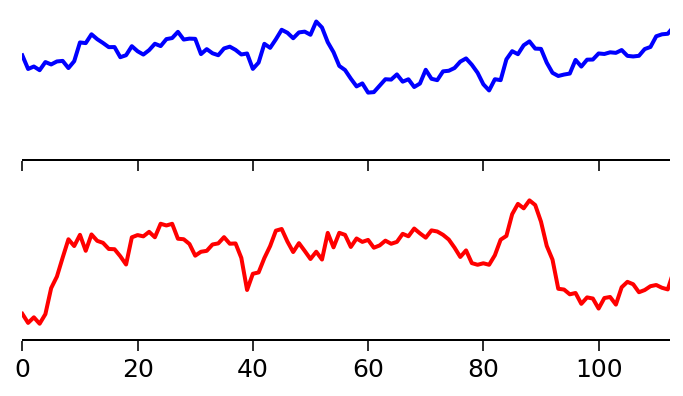

In [11]:
# @markdown for dataset visualization #3

def plot_bold_example3():
  roi = 0
  lbl = next(common_label_generator((None,)))
  ts = load_ts(lbl)[roi]
  evs_0bk = []
  evs_2bk = []
  for lbl in take(4, common_label_generator(("0bk_faces", "0bk_places", "0bk_tools", "0bk_body"))):
    ev = load_ev(lbl)[0]
    evs_0bk.append(ev)
  mask_0bk = slices_to_mask(evs_0bk, len(ts))

  for lbl in take(4, common_label_generator(("2bk_faces", "2bk_places", "2bk_tools", "2bk_body"))):
    ev = load_ev(lbl)[0]
    evs_2bk.append(ev)
  mask_2bk = slices_to_mask(evs_2bk, len(ts))

  bk2 = ts[mask_2bk]
  bk0 = ts[mask_0bk]

  #now we plot that
  fig, axs = plt.subplots(2,1, figsize=(5, 3), sharex=True)
  axs[0].plot(bk0, c="blue", label="0-back", lw=2)
  axs[1].plot(bk2, c="red", label="2-back", lw=2)
  axs[1].set_xlim(0, len(bk2)*TR)
  axs[0] = remove_y_axis(axs[0])
  axs[1] = remove_y_axis(axs[1])
  # fig.legend(loc="center left")
  return fig

fig = plot_bold_example3()

In [12]:
#@markdown for functional network visualization
my_cm = colors.ListedColormap(colormaps.tab20.colors[0:11])

def plot_networks():
  atlas_key = "labels_L"
  mesh_key = "infl_left"
  r = REGIONS.copy()
  codes = pd.Series(r["network"].unique())
  def f(x):
    return codes.index[codes==x][0]+0.5
  x = r["network"].apply(f).to_numpy()

  atlas_path = HCP_DIR / "atlas.npz"
  atlas = dict(**np.load(atlas_path))
  mesh = ni_ds.fetch_surf_fsaverage()[mesh_key]
  x_ = x[atlas[atlas_key]]
  figure = ni_plot.view_surf(mesh, x_, cmap=my_cm, symmetric_cmap=False, colorbar_height=1, vmin=0, vmax=len(codes)-1)
  return figure, codes, mesh

fig, codes, mesh = plot_networks()
print(codes)
fig

0          Visual1
1          Visual2
2      Somatomotor
3     Cingulo-Oper
4         Language
5          Default
6     Frontopariet
7         Auditory
8     Dorsal-atten
9     Posterior-Mu
10    Orbito-Affec
11    Ventral-Mult
dtype: object


## Pipelines

### Linear Model

In [14]:
def extract_low_oscillations(ts: "timeseries, 1d np.ndarray", 
                             min_osc_period: "int, in number of timesteps" = 50, n_freq = 8) -> "np.ndarray of shape (samp, n_freq)":
  n_samp = len(ts)
  coef = fft.dct(ts)[1:n_samp//2] #get DCT coef for the signal, take values for positive frequencies
  freq = fft.fftfreq(n_samp,)[1:n_samp//2] #get DCT frequencies, take values for positive frequencies
  idx = 1/freq > min_osc_period #take only low freqencies
  coef = coef[idx]
  freq = freq[idx]

  idx = np.argsort(coef)[:n_freq] #take only n strongest frequencies
  coef = coef[idx]
  freq = freq[idx]

  x = np.arange(n_samp)
  y = np.zeros((n_samp, n_freq))

  for i in range(n_freq):
    y[:, i] = (np.cos(x*freq[i]) + 1)/2

  return y



In [15]:
def _0bk_vs_2bk_glm_first_level(): # wraped in function to prevent variables from mixing
  result_accum = []
  model = LM.LinearRegression()

  #label generators
  g0bk = common_label_generator(("0bk_faces", "0bk_places", "0bk_tools", "0bk_body"))
  g2bk = common_label_generator(("2bk_faces", "2bk_places", "2bk_tools", "2bk_body"))
  ngen = common_label_generator((None, ))

  for ts_label in ngen: #for each subject
    tss = load_ts(ts_label)
    n_roi = tss.shape[0]
    n_samp = tss.shape[1]

    const = np.ones(n_samp) # constant regressor
    x0bk, x2bk = np.zeros(n_samp), np.zeros(n_samp) # event-related regressors
    for _ in range(4): # in the event regressors mark the events with 1
      ev0 = load_ev(next(g0bk))[0]
      x0bk[ev0] = 1.
      ev2 = load_ev(next(g2bk))[0]
      x2bk[ev2] = 1.

    pre_design = np.stack((x0bk, x2bk, const), axis=-1) #event regressors + const
    
    #now we use the lm
    glm_accum = np.zeros((n_roi, 4)) #this is lm coefficent aggregator
    for i, ts in enumerate(tss):
      oscil = extract_low_oscillations(ts) #compute most significant oscilatory regressors
      design = np.concatenate((pre_design, oscil), axis=-1) #use `visualize_glm_design_matrix` to get it
      fitted_model = model.fit(design, ts)
      c0bk, c2bk = fitted_model.coef_[0], fitted_model.coef_[1]
      err_var = np.var(fitted_model.predict(design) - ts)

      design_orthogonality = design.T @ design # for within-subject t-test
      t0bk = c0bk / np.sqrt(err_var * design_orthogonality[0, 0])
      t2bk = c2bk / np.sqrt(err_var * design_orthogonality[1, 1])
      glm_accum[i] = (c0bk, c2bk, t0bk, t2bk) #accumulate
    result = REGIONS.copy() # result for single subject
    result["coef_0bk"] = glm_accum[:, 0]
    result["coef_2bk"] = glm_accum[:, 1]
    result["tval_within_0bk"] = glm_accum[:, 2]
    result["tval_within_2bk"] = glm_accum[:, 3]
    result["subject"] = ts_label.subject
    result_accum.append(result)
  result_accum = pd.concat(result_accum, axis=0, ignore_index=True)
  return result_accum, design

glm_save_dir = RESULTS_DIR/ "glm"
glm_save_dir.mkdir(exist_ok=True)
result1, sample_lm_design_matrix = _0bk_vs_2bk_glm_first_level()
result1.to_csv(glm_save_dir / "1st_lvl.txt", sep="\t", index=False)

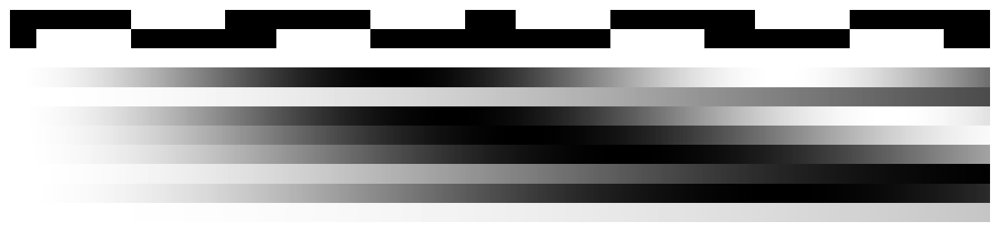

In [16]:
def visualize_glm_design_matrix(m):
  fig, ax = plt.subplots(1,1, figsize=(10, 5))
  _ = ax.imshow(m.T, cmap="gray", aspect=8) # m*n 
  ax.axis("off")
  return fig

fig = visualize_glm_design_matrix(sample_lm_design_matrix)
fig.savefig(glm_save_dir/"design_mat.png", dpi=150)

In [19]:
def _0bk_vs_2bk_glm_second_level(result1: "table from 1st lvl function"):
  coef_0bk = result1.pivot(index="name", columns="subject", values="coef_0bk")
  coef_0bk = coef_0bk.loc[REGIONS["name"]]
  coef_2bk = result1.pivot(index="name", columns="subject", values="coef_2bk")
  coef_2bk = coef_2bk.loc[REGIONS["name"]]
  t_betw, p_betw = stats.ttest_rel(coef_2bk, coef_0bk, axis=1)
  
  p_betw = p_betw * N_PARCELS # Bonferroni correction

  result2 = REGIONS.copy()
  result2["t"] = t_betw
  result2["p with bonferroni"] = p_betw
  return result2

result2 = _0bk_vs_2bk_glm_second_level(result1)
result2.to_csv(glm_save_dir/"2nd_lvl_analysis.txt", sep="\t", index=False)

In [13]:
def plot_3d_map(x, hemisphere):
  is_left = hemisphere.lower() == "l"
  atlas_key = "labels_L" if is_left else "labels_R"
  mesh_key = "infl_left" if is_left else "infl_right"
  atlas_path = HCP_DIR / "atlas.npz"
  atlas = dict(**np.load(atlas_path))
  mesh = ni_ds.fetch_surf_fsaverage()[mesh_key]
  x_ = x[atlas[atlas_key]]
  figure = ni_plot.view_surf(mesh, x_, cmap=colormaps.coolwarm)
  return figure

In [20]:
fig_3d = plot_3d_map(result2['t'].to_numpy(), "l")
fig_3d.save_as_html(glm_save_dir/f"t_values_3d_left.html")
fig_3d

In [21]:
fig_3d = plot_3d_map(result2['t'].to_numpy(), "r")
fig_3d.save_as_html(glm_save_dir/f"t_values_3d_right.html")
fig_3d

In [23]:
result2_t_thresholded = np.where(result2["p with bonferroni"] < 0.05, result2["t"], 0) #for plotting only significant values

In [24]:
fig_3d = plot_3d_map(result2_t_thresholded, "l")
fig_3d.save_as_html(glm_save_dir/f"t_values_3d_left_thresholded.html")
fig_3d

In [25]:
fig_3d = plot_3d_map(result2_t_thresholded, "r")
fig_3d.save_as_html(glm_save_dir/f"t_values_3d_right_thresholded.html")
fig_3d

### Functional Connectivity

In [26]:
def _functional_connectivity():
  g0bk = common_label_generator(("0bk_faces", "0bk_places", "0bk_tools", "0bk_body"))
  g2bk = common_label_generator(("2bk_faces", "2bk_places", "2bk_tools", "2bk_body"))
  ngen = common_label_generator((None, ))

  ts0bk_accum = []
  ts2bk_accum = []
  #for each subject
  for ts_label in ngen:
    ts = load_ts(ts_label)
    #load evs
    ev0bk = (load_ev(next(g0bk))[0] for _ in range(4))
    ev2bk = (load_ev(next(g2bk))[0] for _ in range(4))

    #concatenate ts for 0bk and 2bk
    ts0bk = np.concatenate([ts[..., ev] for ev in ev0bk], axis=1)
    ts2bk = np.concatenate([ts[..., ev] for ev in ev2bk], axis=1) 

    #compute the correlation matrices
    ts0bk_corr = np.corrcoef(ts0bk) # what to do here ?!
    ts2bk_corr = np.corrcoef(ts2bk)

    #filter ROIs (later)
    #accumulate
    ts0bk_accum.append(ts0bk_corr)
    ts2bk_accum.append(ts2bk_corr)

  #stack the matrices
  ts0bk_accum = np.stack(ts0bk_accum, axis=0)
  ts2bk_accum = np.stack(ts2bk_accum, axis=0)
  ts0bk_reduced = np.mean(ts0bk_accum, axis=0)
  ts2bk_reduced = np.mean(ts2bk_accum, axis=0)

  #comapre them along the axis of stacking
  connect_t, connect_p = stats.ttest_ind(ts0bk_accum, ts2bk_accum, axis=0)

  #make t value, p value matrices
  idx = pd.Index(REGIONS["name"])
  ts0bk_reduced = pd.DataFrame(ts0bk_reduced, index=idx, columns=idx)
  ts2bk_reduced = pd.DataFrame(ts2bk_reduced, index=idx, columns=idx)
  connect_t = pd.DataFrame(connect_t, index=idx, columns=idx)
  connect_p = pd.DataFrame(connect_p, index=idx, columns=idx)
  return ts0bk_reduced, ts2bk_reduced, connect_t, connect_p


connectivity_dir = RESULTS_DIR / "connect"
connectivity_dir.mkdir(exist_ok=True)
connect_0bk, connect_2bk, connect_t, connect_p = _functional_connectivity()
connect_0bk.to_csv(connectivity_dir/"connectivity_0bk.txt", sep="\t")
connect_2bk.to_csv(connectivity_dir/"connectivity_2bk.txt", sep="\t")
connect_t.to_csv(connectivity_dir/"connectivity_comparison_t.txt", sep="\t")
connect_p.to_csv(connectivity_dir/"connectivity_comparison_p.txt", sep="\t")

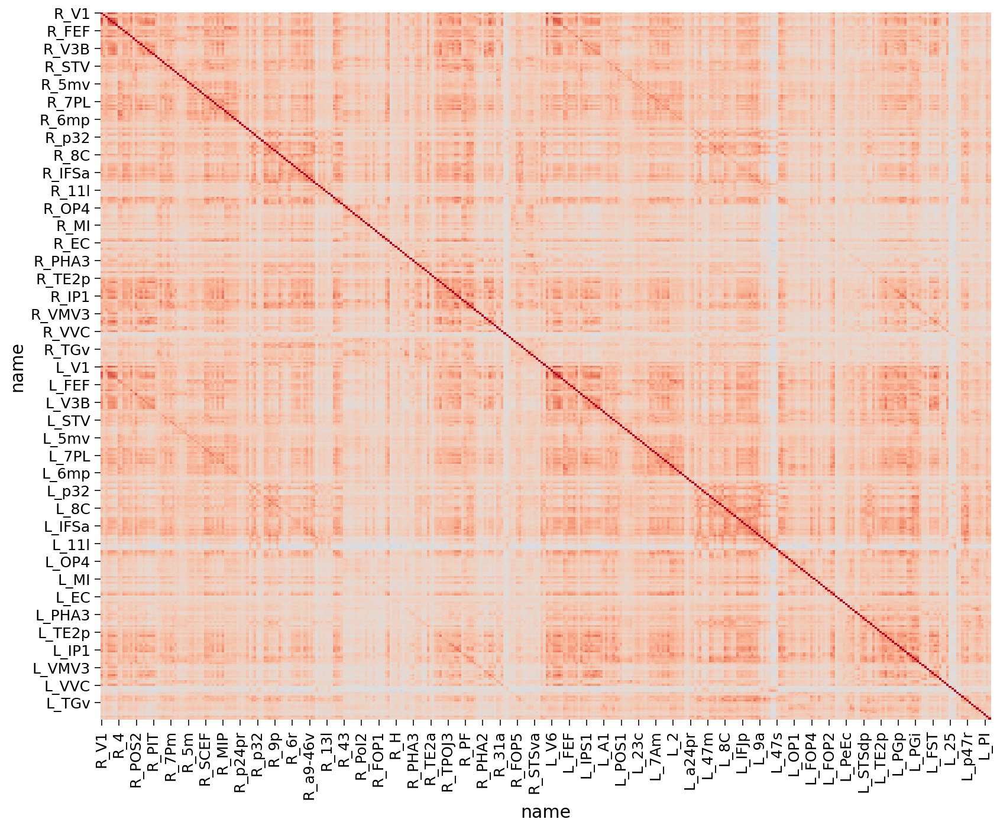

In [40]:
fig, ax = plt.subplots(1,1, figsize=(12,10))
sns.heatmap(connect_0bk, cmap="coolwarm", vmin=-1, vmax=1, ax=ax, cbar=False)

In [36]:
def plot_3d_connectome(m: "connectivity matrix, np.ndarray", thresh: str = "99.3%") -> "fig3d":
  coo = np.load(HCP_DIR/"atlas.npz")["coords"]
  fig_3d = ni_plot.view_connectome(m, coo, edge_threshold=thresh)
  return fig_3d

In [37]:
fig_3d = plot_3d_connectome(connect_0bk)
fig_3d.save_as_html(connectivity_dir / "0k_connect.html")
fig_3d # these are a bit different from the ones in presentation. here it's clearly visible, that activity correlation
#has very little difference in 0-back and 2-back task 

In [38]:
fig_3d = plot_3d_connectome(connect_2bk)
fig_3d.save_as_html(connectivity_dir / "2bk_connect.html")
fig_3d